In [1]:
using Catalyst, DifferentialEquations, Plots, Statistics, LaTeXStrings;

┌ Info: Precompiling Catalyst [479239e8-5488-4da2-87a7-35f2df7eef83]
└ @ Base loading.jl:1278
┌ Info: Precompiling Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
└ @ Base loading.jl:1278


In [15]:
rn = @reaction_network begin
  k_off, g --> g_star
  k_on, g_star --> g
  k_t, g --> g + p
  k_d, p --> 0
end k_off k_on k_t k_d

Model ##ReactionSystem#261 with 4 equations
States (3):
  g(t)
  g_star(t)
  p(t)
Parameters (4):
  k_off
  k_on
  k_t
  k_d

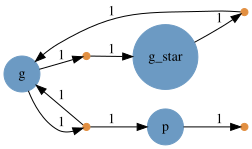

In [18]:
Graph(rn)

In [72]:
p = (0.5, 0.5, 10.0, 0.1)
tspan = (0., 200.0)
u0 = [1., 0., 0.]

prob = DiscreteProblem(rn, u0, tspan, p)

DiscreteProblem with uType Array{Float64,1} and tType Float64. In-place: true
timespan: (0.0, 200.0)
u0: 3-element Array{Float64,1}:
 1.0
 0.0
 0.0

In [73]:
jump_prob = JumpProblem(rn, prob, Direct())



Number of constant rate jumps: 0
Number of variable rate jumps: 0
Have a mass action jump


In [74]:
sol = solve(jump_prob, SSAStepper())

retcode: Default
Interpolation: Piecewise constant interpolation
t: 2047-element Array{Float64,1}:
   0.0
   0.06308864147527969
   0.3506999177573784
   0.4270651250308687
   0.5575222045501641
   0.607450997102632
   0.7653292018179169
   0.8208787890354523
   1.004060132612224
   1.1999094635041283
   1.442598013497653
   1.5405865850614369
   1.8874095671470383
   ⋮
 198.56697832956473
 198.6180694439586
 198.63884674408078
 198.65438148799865
 198.6605728886429
 198.8033607042169
 198.91065377354266
 198.9457787449634
 199.13054938129625
 199.2047975340501
 199.41628080225738
 200.0
u: 2047-element Array{Array{Float64,1},1}:
 [1.0, 0.0, 0.0]
 [1.0, 0.0, 1.0]
 [1.0, 0.0, 2.0]
 [1.0, 0.0, 3.0]
 [1.0, 0.0, 4.0]
 [1.0, 0.0, 5.0]
 [1.0, 0.0, 6.0]
 [1.0, 0.0, 7.0]
 [1.0, 0.0, 8.0]
 [1.0, 0.0, 9.0]
 [1.0, 0.0, 10.0]
 [0.0, 1.0, 10.0]
 [0.0, 1.0, 9.0]
 ⋮
 [1.0, 0.0, 27.0]
 [1.0, 0.0, 28.0]
 [1.0, 0.0, 27.0]
 [1.0, 0.0, 28.0]
 [1.0, 0.0, 29.0]
 [1.0, 0.0, 30.0]
 [1.0, 0.0, 31.0]
 [0.0, 1.0

In [75]:
plot(sol, linewidth=3)

In [76]:
T = 50

condition(u,t,integrator) = t%T==0.0
affect!(integrator) = integrator.u[3] *= 0.5
cb = DiscreteCallback(condition,affect!)
sol = solve(jump_prob, SSAStepper(), callback=cb)
plot(sol, linewidth=3)

In [80]:
T = 50

condition(u,t,integrator) = t%T==0.0
affect!(integrator) = integrator.u[3] *= 0.5
cb = DiscreteCallback(condition,affect!)
sol = solve(jump_prob, SSAStepper(), callback=cb, tstops=[0:T:200;])
plot(sol, linewidth=3)

In [81]:
using Distributions

function partition(n)
    dist = Binomial(n)
    return rand(dist)
end

partition (generic function with 1 method)

In [83]:
T = 25

condition(u,t,integrator) = t%T==0.0
affect!(integrator) = integrator.u[3] = partition(integrator.u[3])
cb = DiscreteCallback(condition,affect!)
sol = solve(jump_prob, SSAStepper(), callback=cb, tstops=[0:T:200;])
plot(sol, linewidth=3)